In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

In [2]:
out_dir = 'output'
if not os.path.isdir(out_dir):
    os.makedirs(out_dir)

In [3]:
out_files = []

In [4]:
reason_dfs = []

## Helper functions

In [5]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [6]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [7]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [8]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [9]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [10]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [11]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [12]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [13]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [14]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Cluster selection functions

In [15]:
def marker_frac_df(adata, markers, clusters = 'louvain_2'):
    gene_cl_frac = sc.pl.dotplot(
        adata, 
        groupby = clusters,
        var_names = markers,
        return_fig = True
    ).dot_size_df
    return gene_cl_frac

def select_clusters_above_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] > cutoff].tolist()

    return select_cl

def select_clusters_below_gene_frac(adata, gene, cutoff, clusters = 'louvain_2'):
    gene_cl_frac = marker_frac_df(adata, gene, clusters)
    select_cl = gene_cl_frac.index[gene_cl_frac[gene] < cutoff].tolist()

    return select_cl

## Processing function

In [16]:
def process_adata(adata, resolution = 2):
    
    # Keep a copy of the raw data
    adata = adata.raw.to_adata()
    adata.raw = adata

    print('Normalizing', end = "; ")
    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    print('Finding HVGs', end = "; ")
    # Restrict downstream steps to variable genes
    sc.pp.highly_variable_genes(adata)
    adata = adata[:, adata.var_names[adata.var['highly_variable']]].copy()

    print('Scaling', end = "; ")
    # Scale variable genes
    sc.pp.scale(adata)

    print('PCA', end = "; ")
    # Run PCA
    sc.tl.pca(adata, svd_solver = 'arpack')
    
    print('Neighbors', end = "; ")
    # Find nearest neighbors
    sc.pp.neighbors(
        adata, 
        n_neighbors = 50,
        n_pcs = 30
    )

    print('Leiden', end = "; ")
    # Find clusters
    sc.tl.leiden(
        adata, 
        resolution = resolution, 
        key_added = 'leiden_{r}'.format(r = resolution),
        n_iterations = 2
    )

    print('UMAP', end = "; ")
    # Run UMAP
    sc.tl.umap(adata, min_dist = 0.05)
    
    print('Renormalizing')
    adata = adata.raw.to_adata()
    adata.raw = adata

    # Normalize and log transform
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    
    return adata

## Markers for dotplots

In [17]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [18]:
class_markers = [
    'AXL',     # ASDCs
    'C1orf54',
    'CCL3',    # IL1B+ Monocytes
    'CD14',    # CD14+ Monocytes and cDC2s
    'CD1C',    # cDC2
    'CD74',
    'CDKN1C',
    'CLEC9A',
    'CST3',
    'FCER1A',  # cDC2
    'FCGR3A',  # CD16+ Monocytes
    'HLA-DRA', # CD16+ Monocytes; DCs
    'IFI44L',  # ISG+ cells
    'IL1B',
    'IRF4',    # pDC
    'IRF8',    # pDC
    'ISG15',
    'LST1',
    'MX1',
    'NFKBIA',   # IL1B+ Monocytes
    'S100A9',
    'VCAN'
]

## Read previous, non-tracked labels
We ran a preliminary analysis of our dataset that wasn't tracked for reproducibility. Here, we'll retrieve the labels for visualization and comparison to check for consistency.

In [19]:
original_uuid = '3868592c-0087-4ed8-98b2-4bf1b8676111'
original_df = read_parquet_uuid(original_uuid)
original_df = original_df[['barcodes', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3']]
original_df = original_df.rename({'AIFI_L1': 'original_L1', 'AIFI_L2': 'original_L2', 'AIFI_L3': 'original_L3'}, axis = 1)

In [20]:
original_df.head()

,barcodes,original_L1,original_L2,original_L3
0,05ea9806794211eb93b836d1cb6129eb,DC,cDC1,cDC1
1,e225c914794011eb9282e2ceeb91ba52,DC,cDC1,cDC1
2,b1379eae795411eb958b0245821e6993,DC,cDC1,cDC1
3,b13d3a8a795411eb958b0245821e6993,DC,cDC1,cDC1
4,b1430d16795411eb958b0245821e6993,DC,cDC1,cDC1


In [21]:
test = original_df[original_df['original_L3'].str.contains('IL1B')]

In [22]:
test.shape

(21184, 4)

## Read cell type hierarchy

In [23]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [24]:
search_id = 'europium-phosphorus-plutonium'

Retrieve files stored in our HISE project store

In [25]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [26]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [27]:
search_df['AIFI_L3'].tolist()

['ASDC',
 'C1Q+ CD16 monocyte',
 'CD14+ cDC2',
 'Core CD14 monocyte',
 'Core CD16 monocyte',
 'HLA-DRhi cDC2',
 'IL1B+ CD14 monocyte',
 'ISG+ CD14 monocyte',
 'ISG+ CD16 monocyte',
 'ISG+ cDC2',
 'Intermediate monocyte',
 'cDC1',
 'pDC']

# Updated filtering

## Filter ASDC

### Proposed updates

- Remove HBB+, PPBP+, and CD79A+ clusters as doublets

In [23]:
cell_type = 'ASDC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [24]:
type_uuid

'8ce25d9b-42a2-4323-9eb7-1a8b9f0a0d9c'

In [25]:
adata = read_adata_uuid(type_uuid)

### Clustering

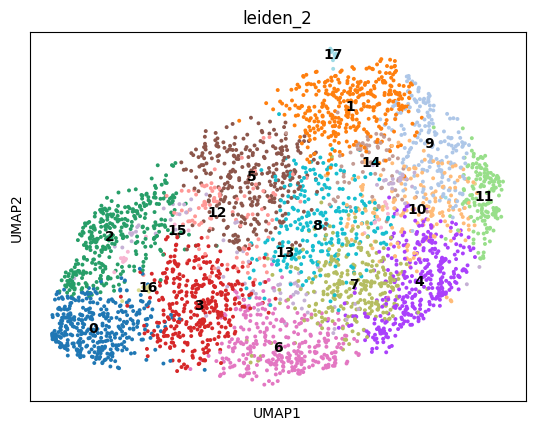

In [26]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

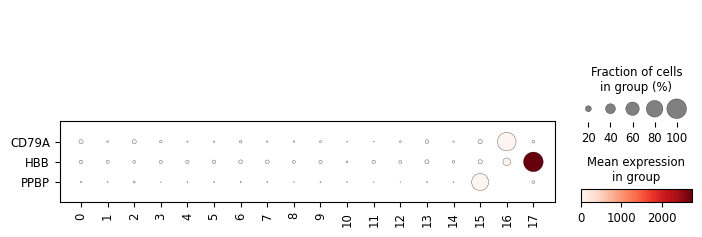

In [32]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD79A', 'HBB', 'PPBP'], swap_axes = True)

### Selection

In [34]:
cd79a_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD79A', 0.8, 'leiden_2'
)
hbb_pos_cl = select_clusters_above_gene_frac(
    adata, 'HBB', 0.8, 'leiden_2'
)
ppbp_pos_cl = select_clusters_above_gene_frac(
    adata, 'PPBP', 0.8, 'leiden_2'
)
sel_cl = cd79a_pos_cl + hbb_pos_cl + ppbp_pos_cl
sel_cl

['16', '17', '15']

In [36]:
sel_adata = adata[adata.obs['leiden_2'].isin(sel_cl)]
sel_adata.shape

(50, 33538)

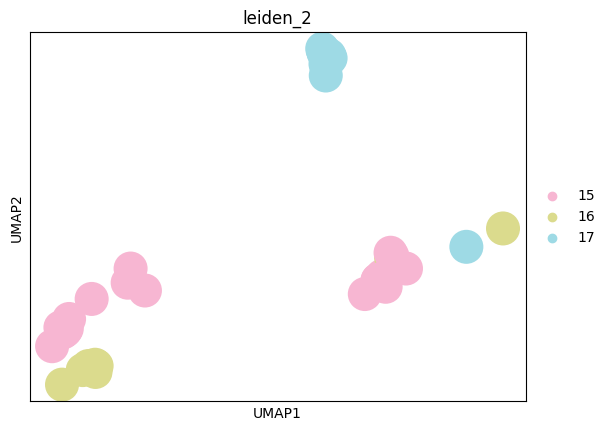

In [37]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### Removal

In [38]:
sel_bc = sel_adata.obs['barcodes']

In [39]:
print(adata.shape)
filter_idx = [not x for x in adata.obs['barcodes'].isin(sel_bc)]
adata = adata[filter_idx]
print(adata.shape)

(3761, 33538)
(3711, 33538)


### Reprocess filtered cells

In [40]:
adata = process_adata(adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


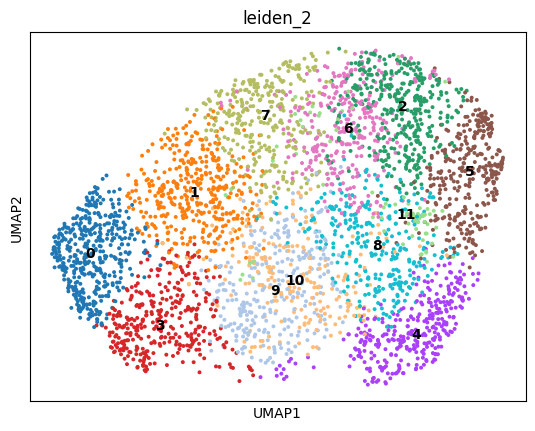

In [41]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [45]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Core CD14 monocyte

### Proposed updates

- Iteratively cluster FCER1A cluster (16) to delineate CD14+ cDC2 cells
- Reassign FCGR3A-high cluster (21) as mislabeled

In [269]:
cell_type = 'Core CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [270]:
type_uuid

'251daf13-9676-4306-ad24-efb98a7462eb'

In [271]:
adata = read_adata_uuid(type_uuid)

### Clustering

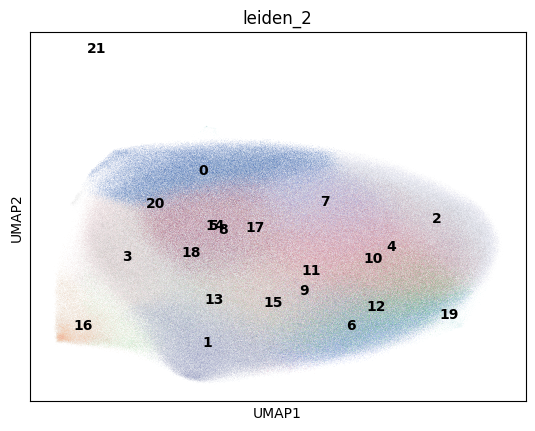

In [272]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

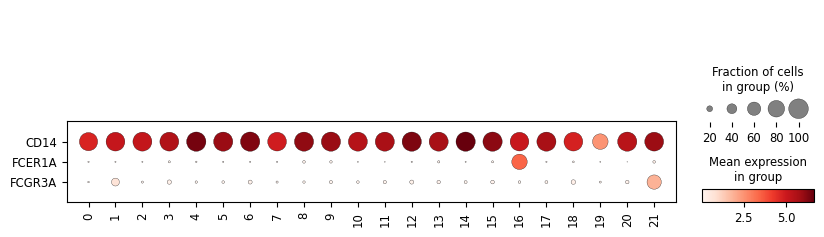

In [273]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCER1A', 'FCGR3A'], swap_axes = True)

### FCER1A Selection

In [274]:
fcer1a_pos_cl = select_clusters_above_gene_frac(
    adata, 'FCER1A', 0.5, 'leiden_2'
)
fcer1a_pos_cl

['16']

In [275]:
fcer1a_adata = adata[adata.obs['leiden_2'].isin(fcer1a_pos_cl)]
fcer1a_adata.shape

(41356, 33538)

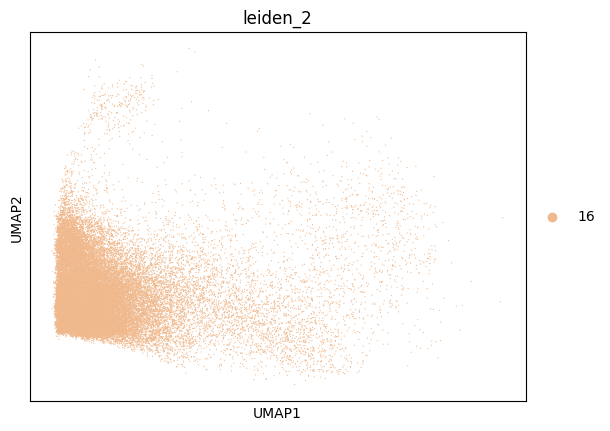

In [276]:
sc.pl.umap(fcer1a_adata, color = 'leiden_2')

### FCER1A Iterative clustering

In [277]:
fcer1a_adata = process_adata(fcer1a_adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


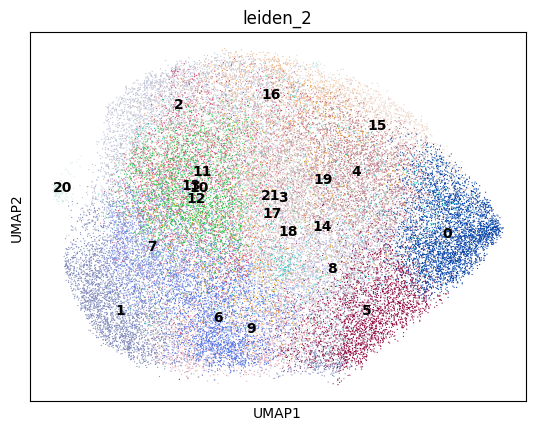

In [278]:
sc.pl.umap(fcer1a_adata, color = 'leiden_2', legend_loc = 'on data')

### FCER1A Marker expression

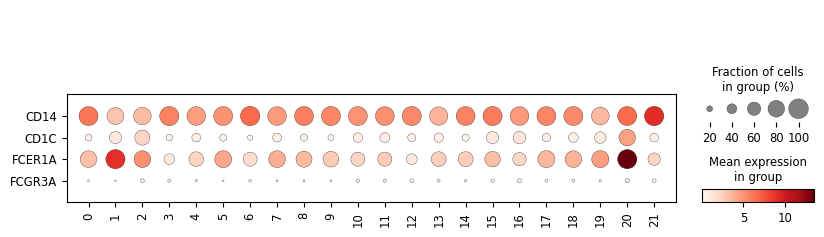

In [279]:
sc.pl.dotplot(fcer1a_adata, groupby = 'leiden_2', var_names = ['CD14', 'CD1C', 'FCER1A', 'FCGR3A'], swap_axes = True)

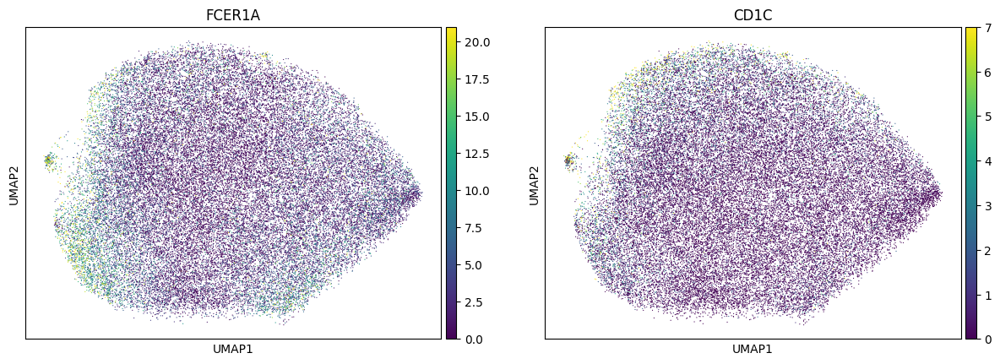

In [280]:
sc.pl.umap(fcer1a_adata, color = ['FCER1A','CD1C'], vmax = 'p99')

### FCER1A Iterative CD1C selection

In [281]:
cd1c_pos_cl = select_clusters_above_gene_frac(
    fcer1a_adata, 'CD1C', 0.5, 'leiden_2'
)
cd1c_pos_cl

['1', '2', '15', '16', '20']

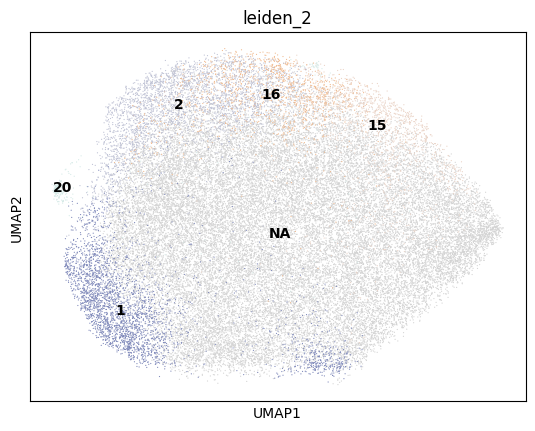

In [282]:
sc.pl.umap(fcer1a_adata, color = 'leiden_2', legend_loc = 'on data', groups = cd1c_pos_cl)

### FCER1A Reassignment

In [283]:
sel_cd1c_bc = fcer1a_adata.obs['barcodes'].loc[fcer1a_adata.obs['leiden_2'].isin(cd1c_pos_cl)]

In [284]:
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.add_categories(['CD14+ cDC2'])
adata.obs['AIFI_L3'].loc[adata.obs['barcodes'].isin(sel_cd1c_bc)] = 'CD14+ cDC2'

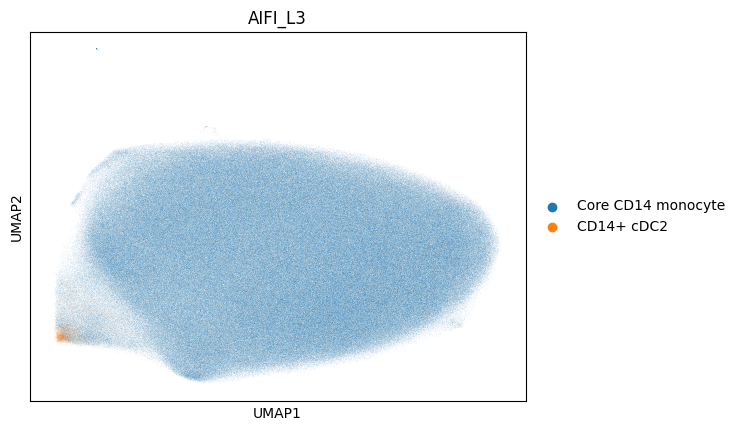

In [285]:
sc.pl.umap(adata, color = 'AIFI_L3')

In [286]:
cd14_cdc2_adata = adata[adata.obs['AIFI_L3'] == 'CD14+ cDC2']
cd14_cdc2_adata.obs['AIFI_L3'] = cd14_cdc2_adata.obs['AIFI_L3'].cat.remove_unused_categories()
cd14_cdc2_adata.obs['origin'] = cell_type

**Reassigned cells will be added to CD14+ cDC2 cells below**

### FCER1A Filtering

In [70]:
adata = adata[adata.obs['AIFI_L3'] != 'CD14+ cDC2']
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.remove_unused_categories()

### FCGR3A Selection

In [72]:
fcgr3a_pos_cl = select_clusters_above_gene_frac(
    adata, 'FCGR3A', 0.6, 'leiden_2'
)
fcgr3a_pos_cl

['21']

In [73]:
sel_adata = adata[adata.obs['leiden_2'].isin(fcgr3a_pos_cl)]
sel_adata.shape

(116, 33538)

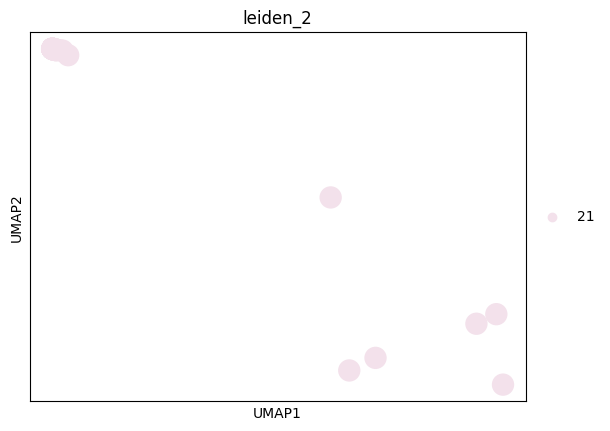

In [74]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### FCGR3A Filtering

In [75]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(fcgr3a_pos_cl)]
adata = adata[filter_idx]

### Reprocess filtered cells

In [40]:
adata = process_adata(adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


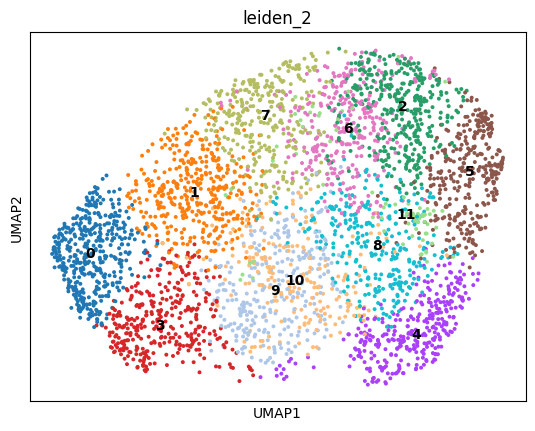

In [41]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [45]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter ISG+ CD14 monocyte

### Proposed updates

Remove CD3D+ cells?

In [57]:
cell_type = 'ISG+ CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [58]:
type_uuid

'1a077b56-8ce3-4782-8db9-e34cd340f835'

In [59]:
adata = read_adata_uuid(type_uuid)

### Clustering

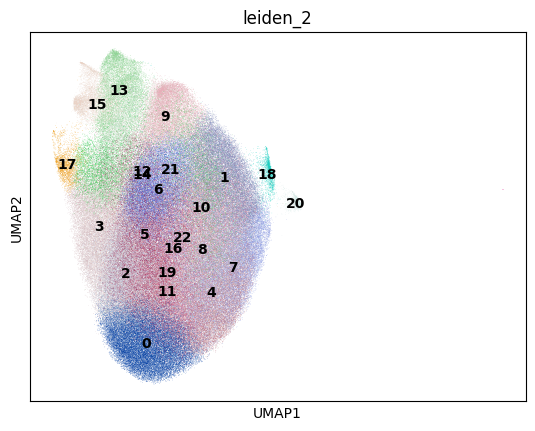

In [60]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

In [61]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D', 'CD3E'], swap_axes = True)


KeyboardInterrupt



### CD3D Selection

In [ ]:
cd3d_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD3D', 0.1, 'leiden_2'
)
cd3d_pos_cl

In [ ]:
sel_adata = adata[adata.obs['leiden_2'].isin(cd3d_pos_cl)]
sel_adata.shape

In [ ]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### CD3D Filtering

In [ ]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(cd3d_pos_cl)]
adata = adata[filter_idx]

### Reprocess filtered cells

In [ ]:
adata = process_adata(adata, resolution = 2)

In [ ]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter IL1B+ CD14 monocyte

### Proposed updates

- Remove CST3- cluster (23) as non-monocyte
- Remove CD3D+ cluster (21) as T cell doublet
- Remove HBB+ cluster (22) as Erythrocyte doublet

In [62]:
cell_type = 'IL1B+ CD14 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [63]:
type_uuid

'151546da-6b2e-430b-9965-672dfbed3349'

In [64]:
adata = read_adata_uuid(type_uuid)

### Clustering

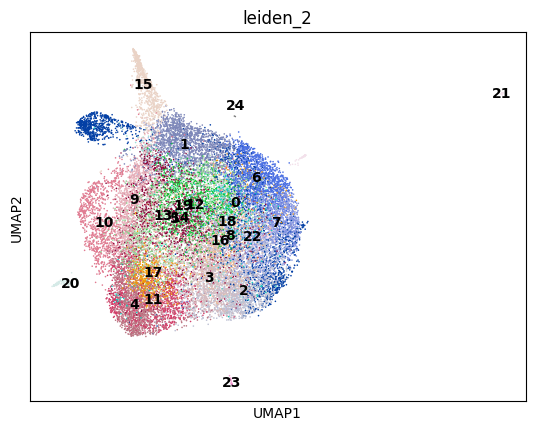

In [65]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

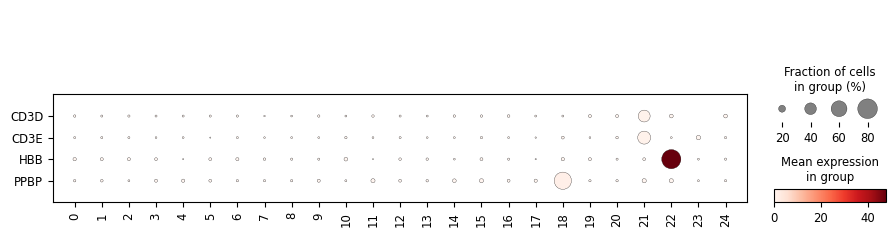

In [66]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D', 'CD3E', 'HBB', 'PPBP'], swap_axes = True)

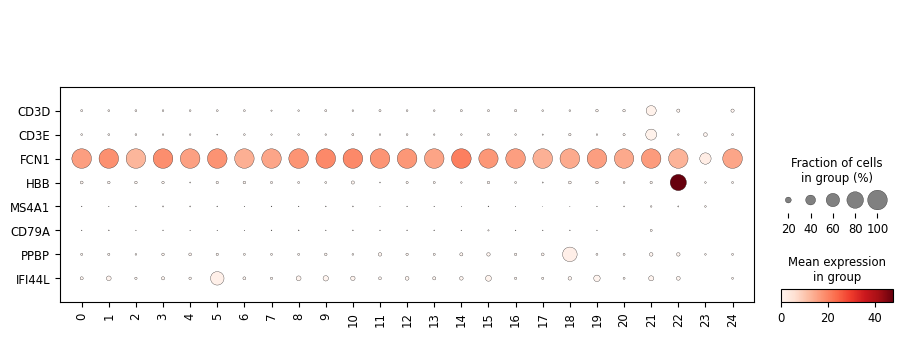

In [67]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### CD3D Selection

In [68]:
cd3d_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD3D', 0.2, 'leiden_2'
)
cd3d_pos_cl

['21']

In [69]:
sel_adata = adata[adata.obs['leiden_2'].isin(cd3d_pos_cl)]
sel_adata.shape

(115, 33538)

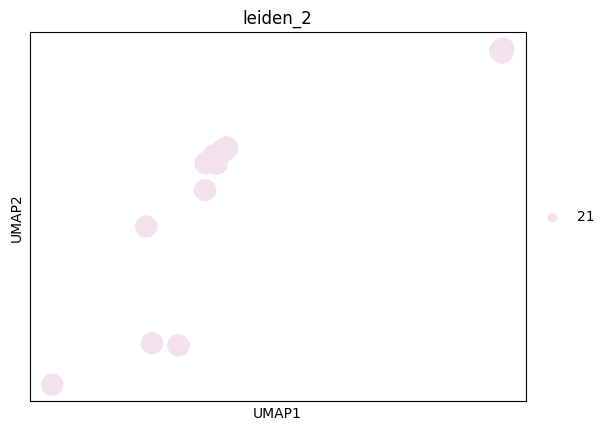

In [70]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### CD3D Filtering

In [71]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(cd3d_pos_cl)]
adata = adata[filter_idx]

### HBB Selection

In [72]:
hbb_pos_cl = select_clusters_above_gene_frac(
    adata, 'HBB', 0.5, 'leiden_2'
)
hbb_pos_cl

['22']

In [73]:
sel_adata = adata[adata.obs['leiden_2'].isin(hbb_pos_cl)]
sel_adata.shape

(89, 33538)

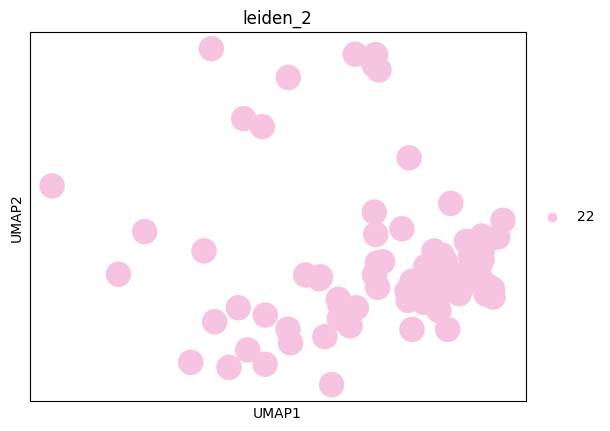

In [74]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### HBB Filtering

In [75]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(hbb_pos_cl)]
adata = adata[filter_idx]

### PPBP Selection

In [76]:
ppbp_pos_cl = select_clusters_above_gene_frac(
    adata, 'PPBP', 0.5, 'leiden_2'
)
ppbp_pos_cl

['18']

In [77]:
sel_adata = adata[adata.obs['leiden_2'].isin(ppbp_pos_cl)]
sel_adata.shape

(340, 33538)

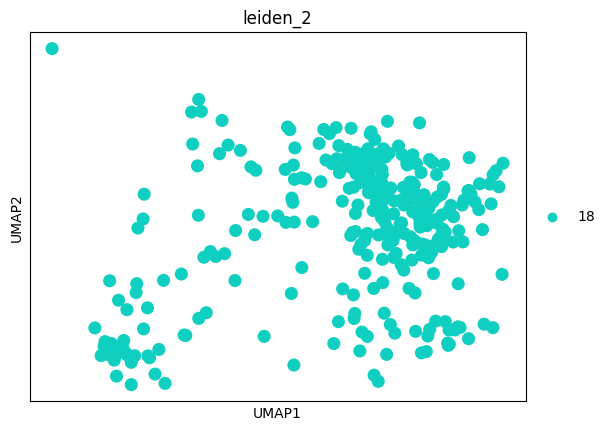

In [78]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### PPBP Filtering

In [79]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(ppbp_pos_cl)]
adata = adata[filter_idx]

### Low FCN1 Selection

In [80]:
fcn1_neg_cl = select_clusters_below_gene_frac(
    adata, 'FCN1', 0.5, 'leiden_2'
)
fcn1_neg_cl

['23']

In [81]:
sel_adata = adata[adata.obs['leiden_2'].isin(fcn1_neg_cl)]
sel_adata.shape

(27, 33538)

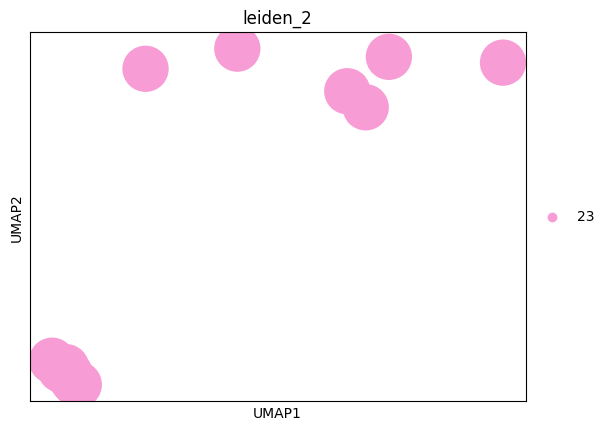

In [82]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### Low FCN1 Filtering

In [53]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(fcn1_neg_cl)]
adata = adata[filter_idx]

### Reprocess filtered cells

In [54]:
adata = process_adata(adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


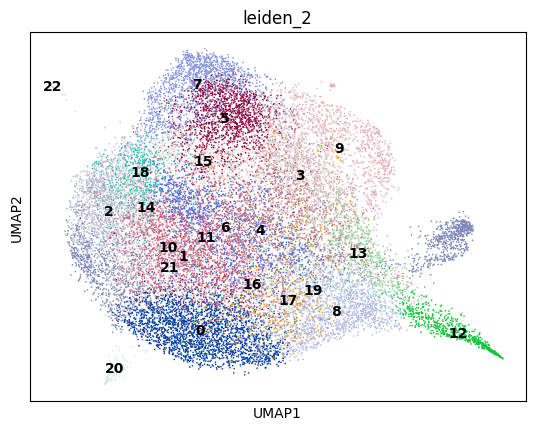

In [55]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

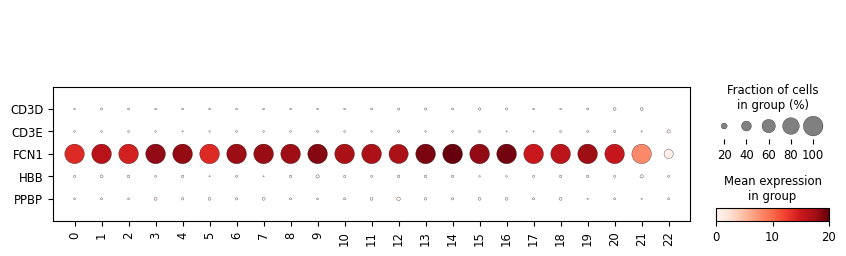

In [56]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD3D', 'CD3E', 'FCN1', 'HBB', 'PPBP'], swap_axes = True)

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter Core CD16 monocyte

### Proposed changes
- Iteratively cluster CD14-high cluster (4,6,13) to delineate Intermediate monocytes

In [84]:
cell_type = 'Core CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [85]:
type_uuid

'e70278dd-bf2c-4696-bdf5-a38281bc20fd'

In [122]:
adata = read_adata_uuid(type_uuid)

### Clustering

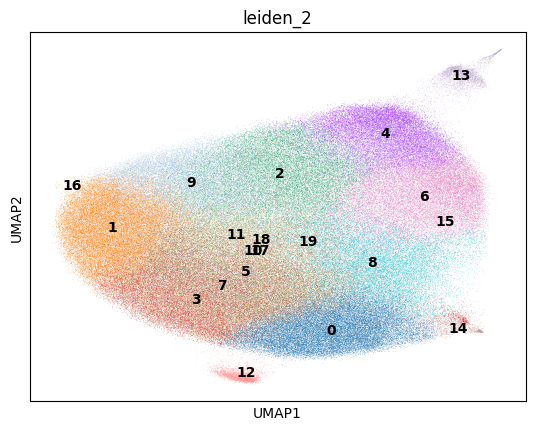

In [123]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

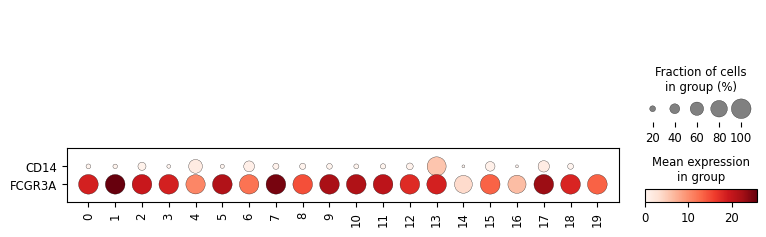

In [124]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14','FCGR3A'], swap_axes = True)

### CD14 Selection

In [125]:
cd14_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD14', 0.4, 'leiden_2'
)
cd14_pos_cl

['4', '6', '13', '17']

In [126]:
cd14_adata = adata[adata.obs['leiden_2'].isin(cd14_pos_cl)]
cd14_adata.shape

(51080, 33538)

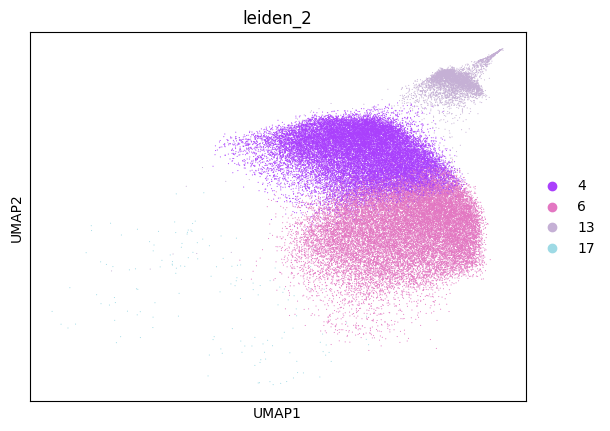

In [127]:
sc.pl.umap(cd14_adata, color = 'leiden_2')

### CD14 Iterative clustering

In [129]:
cd14_adata = process_adata(cd14_adata, resolution = 1)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


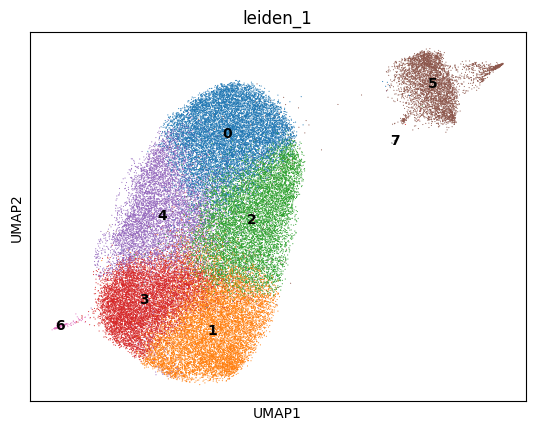

In [130]:
sc.pl.umap(cd14_adata, color = 'leiden_1', legend_loc = 'on data')

### CD14 Marker expression

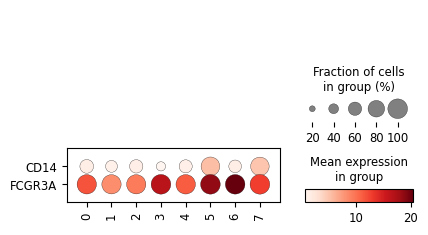

In [131]:
sc.pl.dotplot(cd14_adata, groupby = 'leiden_1', var_names = ['CD14', 'FCGR3A'], swap_axes = True)

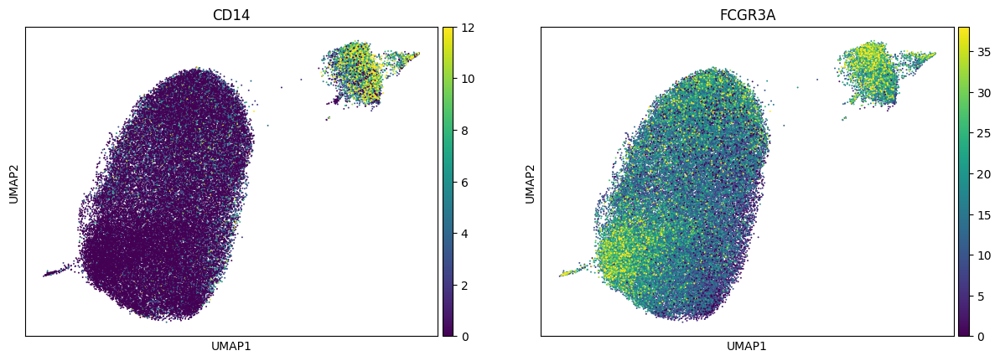

In [132]:
sc.pl.umap(cd14_adata, color = ['CD14','FCGR3A'], vmax = 'p99', size = 8)

### CD14+/CD16+ Iterative selection

In [138]:
dbl_pos_cl = select_clusters_above_gene_frac(
    cd14_adata, 'CD14', 0.5, 'leiden_1'
)
dbl_pos_cl

['0', '1', '2', '4', '5', '6', '7']

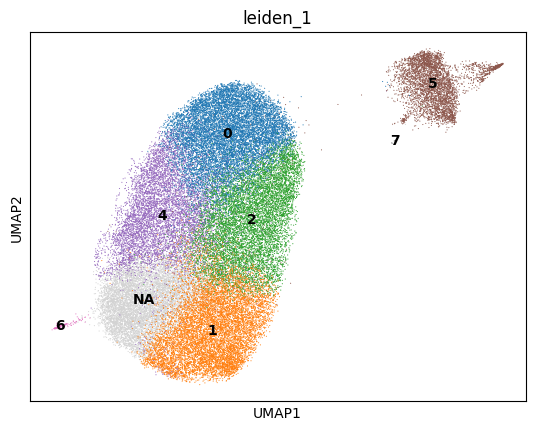

In [139]:
sc.pl.umap(cd14_adata, color = 'leiden_1', legend_loc = 'on data', groups = dbl_pos_cl)

### CD14+/CD16+ Reassignment

In [140]:
sel_cd14_bc = cd14_adata.obs['barcodes'].loc[cd14_adata.obs['leiden_1'].isin(dbl_pos_cl)]

In [142]:
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.add_categories(['Intermediate monoctye'])
adata.obs['AIFI_L3'].loc[adata.obs['barcodes'].isin(sel_cd14_bc)] = 'Intermediate monoctye'

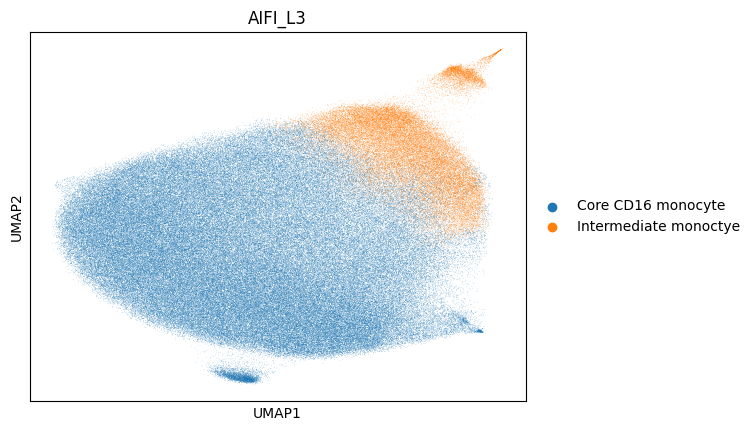

In [143]:
sc.pl.umap(adata, color = 'AIFI_L3')

In [145]:
cd16_intermediate_adata = adata[adata.obs['AIFI_L3'] == 'Intermediate monocyte']
cd16_intermediate_adata.obs['AIFI_L3'] = cd16_intermediate_adata.obs['AIFI_L3'].cat.remove_unused_categories()
cd16_intermediate_adata.obs['origin'] = cell_type

**Reassigned cells will be added to Intermediate monocytes below**

### Remove Intermediate monocyte

In [147]:
adata = adata[adata.obs['AIFI_L3'] != 'Intermediate monocyte']
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.remove_unused_categories()

### Reprocess filtered cells

In [54]:
adata = process_adata(adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


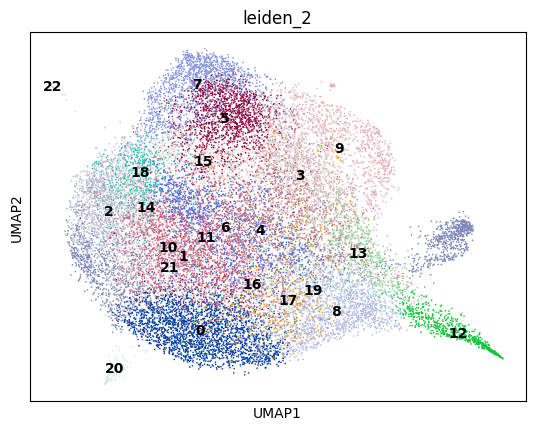

In [55]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

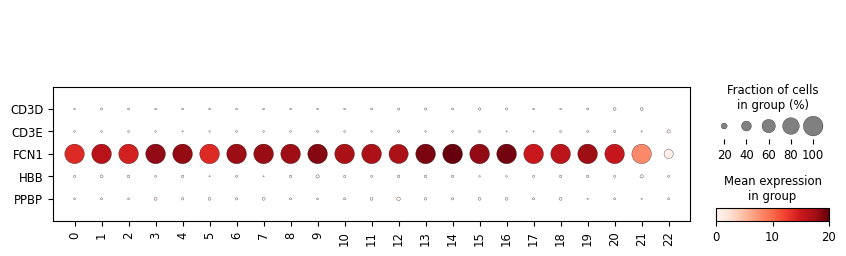

In [56]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCGR3A'], swap_axes = True)

### Save filtered cells

In [ ]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter C1Q+ CD16 monocyte

### Proposed updates

- Remove CD3D+ cluster (24) as T cell doublet
- Reassign VCAN/S100A9-high (19) cluster as CD14+ cDC2
- Reassign CD14-pos cluster (19) as Intermediate monocyte

In [216]:
cell_type = 'C1Q+ CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [217]:
type_uuid

'5474cd1d-4c53-457b-b25f-a28e90794604'

In [218]:
adata = read_adata_uuid(type_uuid)

### Clustering

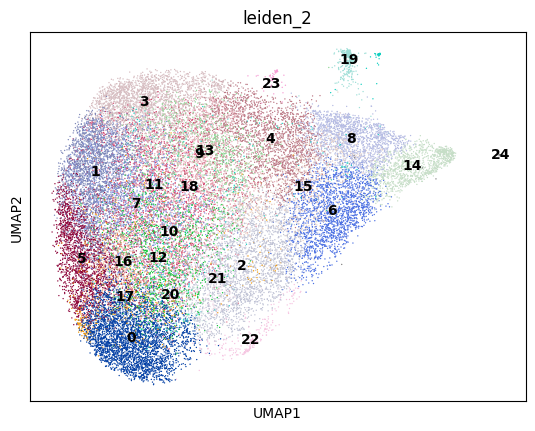

In [219]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

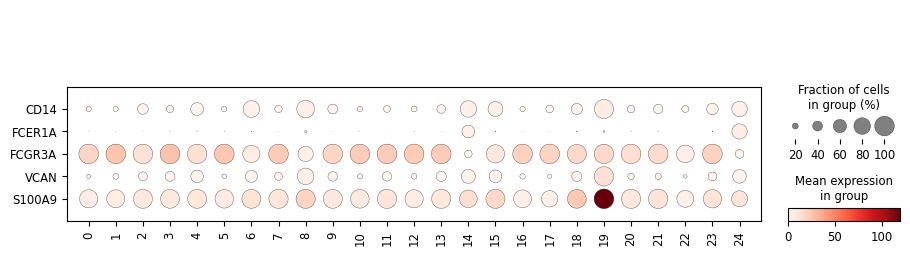

In [220]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCER1A', 'FCGR3A','VCAN', 'S100A9'], swap_axes = True)

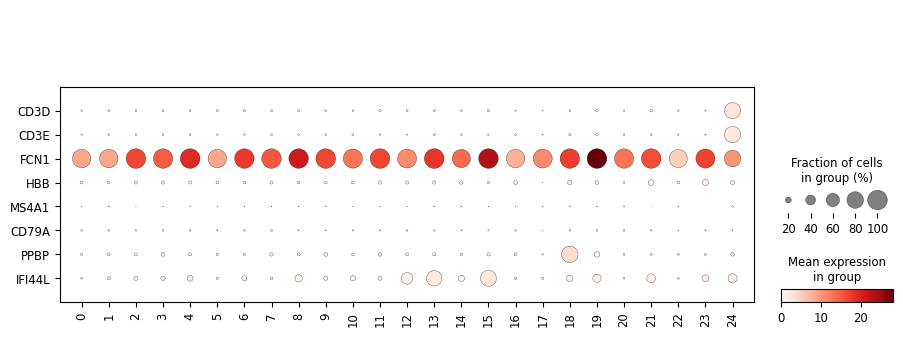

In [221]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### CD3D Selection

In [222]:
cd3d_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD3D', 0.1, 'leiden_2'
)
cd3d_pos_cl

['24']

In [223]:
sel_adata = adata[adata.obs['leiden_2'].isin(cd3d_pos_cl)]
sel_adata.shape

(59, 33538)

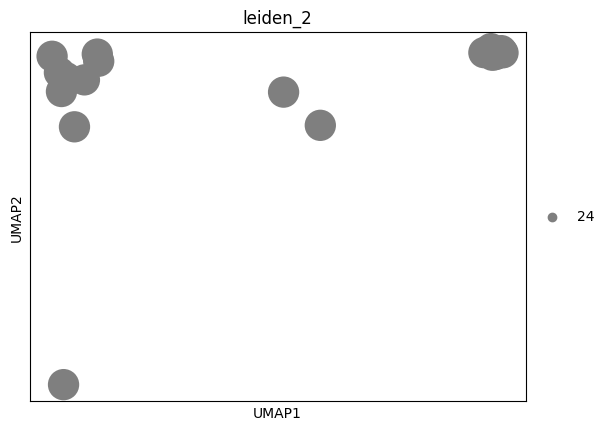

In [224]:
sc.pl.umap(sel_adata, color = 'leiden_2')

### CD3D Filtering

In [225]:
filter_idx = [not x for x in adata.obs['leiden_2'].isin(cd3d_pos_cl)]
adata = adata[filter_idx]

### FCER1A Selection

In [226]:
fcer1a_pos_cl = select_clusters_above_gene_frac(
    adata, 'FCER1A', 0.5, 'leiden_2'
)
fcer1a_pos_cl

['14']

In [227]:
fcer1a_adata = adata[adata.obs['leiden_2'].isin(fcer1a_pos_cl)]
fcer1a_adata.shape

(1116, 33538)

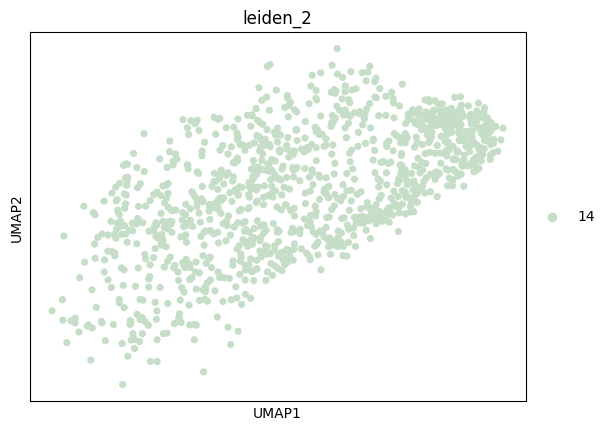

In [228]:
sc.pl.umap(fcer1a_adata, color = 'leiden_2')

### FCER1A Reassignment

In [229]:
sel_cd1c_bc = adata.obs['barcodes'].loc[adata.obs['leiden_2'].isin(fcer1a_pos_cl)]

In [230]:
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.add_categories(['CD14+ cDC2'])
adata.obs['AIFI_L3'].loc[adata.obs['barcodes'].isin(sel_cd1c_bc)] = 'CD14+ cDC2'

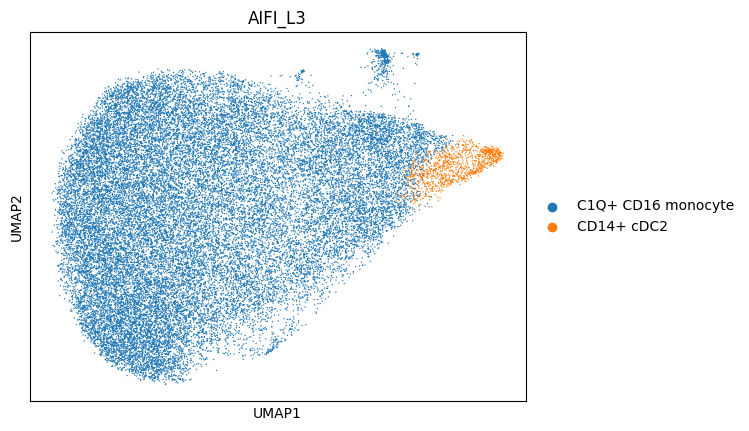

In [231]:
sc.pl.umap(adata, color = 'AIFI_L3')

In [232]:
c1q_cdc2_adata = adata[adata.obs['AIFI_L3'] == 'CD14+ cDC2']
c1q_cdc2_adata.obs['AIFI_L3'] = c1q_cdc2_adata.obs['AIFI_L3'].cat.remove_unused_categories()
c1q_cdc2_adata.obs['origin'] = cell_type

**Reassigned cells will be added to CD14+ cDC2 cells below**

### FCER1A Filtering

In [233]:
adata = adata[adata.obs['AIFI_L3'] != 'CD14+ cDC2']
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.remove_unused_categories()

### CD14 Selection

In [234]:
cd14_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD14', 0.9, 'leiden_2'
)
cd14_pos_cl

['19']

In [235]:
cd14_adata = adata[adata.obs['leiden_2'].isin(cd14_pos_cl)]
cd14_adata.shape

(341, 33538)

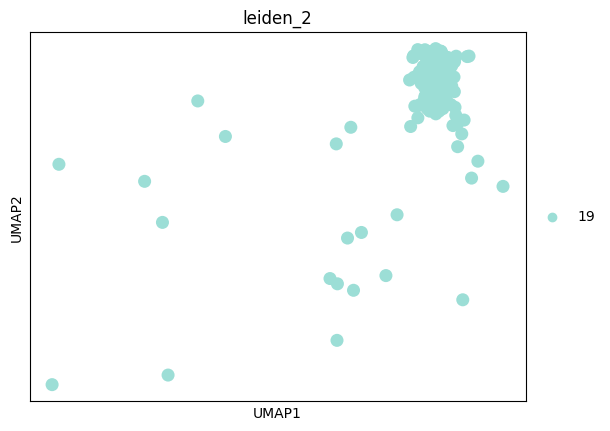

In [236]:
sc.pl.umap(cd14_adata, color = 'leiden_2')

### CD14 selection

In [237]:
dbl_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD14', 0.9, 'leiden_2'
)
dbl_pos_cl

['19']

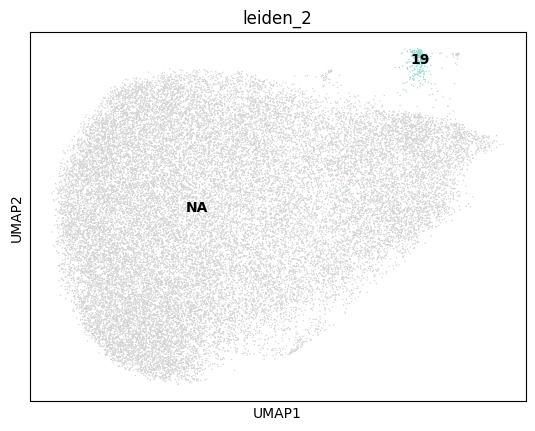

In [238]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = dbl_pos_cl)

### CD14 Reassignment

In [239]:
sel_cd14_bc = adata.obs['barcodes'].loc[adata.obs['leiden_2'].isin(dbl_pos_cl)]

In [240]:
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.add_categories(['Intermediate monocyte'])
adata.obs['AIFI_L3'].loc[adata.obs['barcodes'].isin(sel_cd14_bc)] = 'Intermediate monocyte'

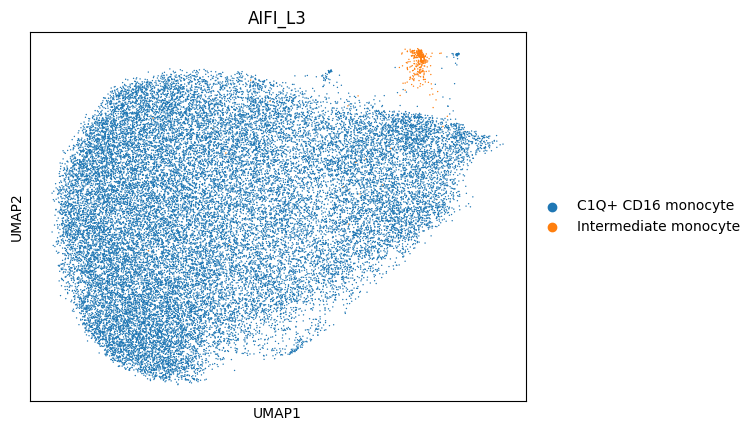

In [241]:
sc.pl.umap(adata, color = 'AIFI_L3')

In [242]:
c1q_intermediate_adata = adata[adata.obs['AIFI_L3'] == 'Intermediate monocyte']
c1q_intermediate_adata.obs['AIFI_L3'] = c1q_intermediate_adata.obs['AIFI_L3'].cat.remove_unused_categories()
c1q_intermediate_adata.obs['origin'] = cell_type

**Reassigned cells will be added to Intermediate monocytes below**

### CD14 Filtering

In [243]:
adata = adata[adata.obs['AIFI_L3'] != 'Intermediate monocyte']
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.remove_unused_categories()

### Reprocess filtered cells

In [244]:
adata = process_adata(adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


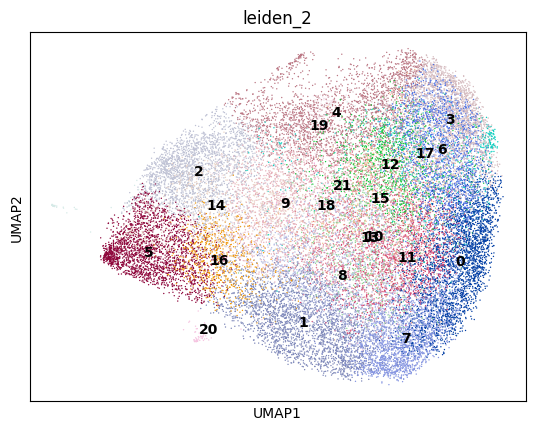

In [245]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [246]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

## Filter ISG+ CD16 monocyte

### Proposed updates

- Reassign CD14+ cluster as ISG+ CD14 monocyte

In [247]:
cell_type = 'ISG+ CD16 monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [248]:
type_uuid

'e4ecfc35-bc66-4fe8-80b3-93fe6205ce1b'

In [249]:
adata = read_adata_uuid(type_uuid)

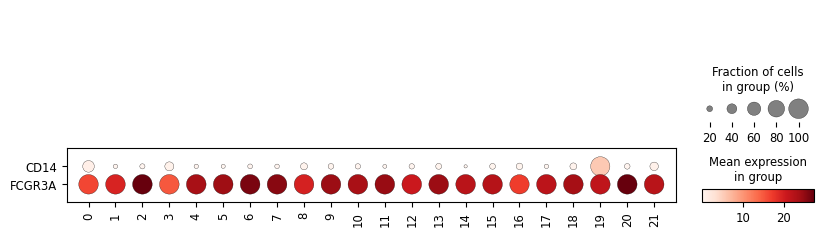

In [251]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = ['CD14', 'FCGR3A'], swap_axes = True)

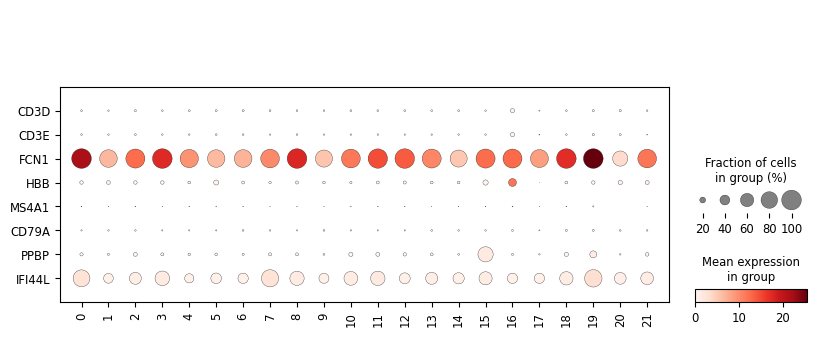

In [250]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

### CD14 selection

In [254]:
cd14_pos_cl = select_clusters_above_gene_frac(
    adata, 'CD14', 0.9, 'leiden_2'
)
cd14_pos_cl

['19']

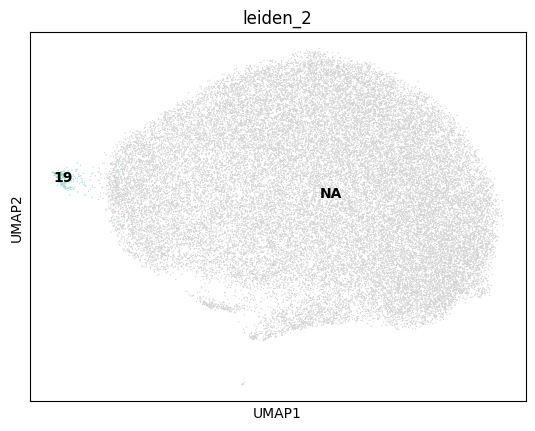

In [255]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data', groups = cd14_pos_cl)

### CD14 Reassignment

In [256]:
sel_cd14_bc = adata.obs['barcodes'].loc[adata.obs['leiden_2'].isin(cd14_pos_cl)]

In [257]:
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.add_categories(['ISG+ CD14 monocyte'])
adata.obs['AIFI_L3'].loc[adata.obs['barcodes'].isin(sel_cd14_bc)] = 'ISG+ CD14 monocyte'

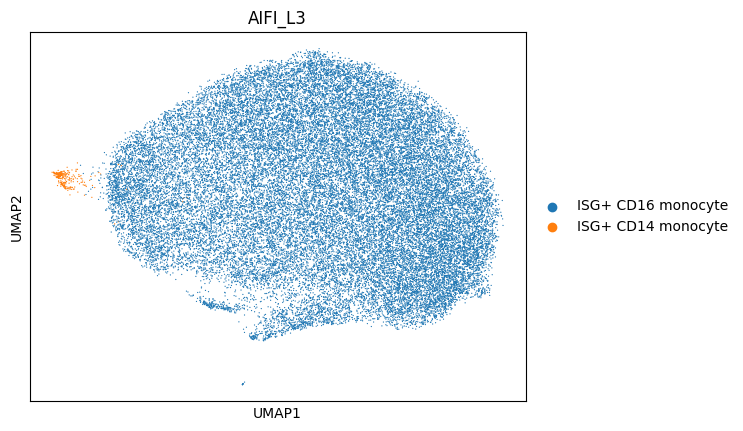

In [258]:
sc.pl.umap(adata, color = 'AIFI_L3')

In [259]:
cd16_isg_cd14_adata = adata[adata.obs['AIFI_L3'] == 'ISG+ CD14 monocyte']
cd16_isg_cd14_adata.obs['AIFI_L3'] = cd16_isg_cd14_adata.obs['AIFI_L3'].cat.remove_unused_categories()
cd16_isg_cd14_adata.obs['origin'] = cell_type

### CD14 Filtering

In [260]:
adata = adata[adata.obs['AIFI_L3'] != 'ISG+ CD14 monocyte']
adata.obs['AIFI_L3'] = adata.obs['AIFI_L3'].cat.remove_unused_categories()

### Reprocess filtered cells

In [261]:
adata = process_adata(adata, resolution = 2)

Normalizing; WARNING: adata.X seems to be already log-transformed.
Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


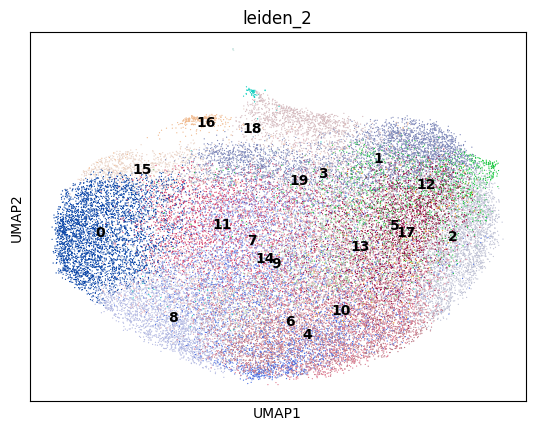

In [262]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Save filtered cells

In [263]:
out_type = format_cell_type(cell_type)
out_file = 'output/diha_filtered_celltypist_L3_{ot}_{d}.h5ad'.format(ot = out_type, d = date.today())
adata.write_h5ad(out_file)
out_files.append(out_file)

# Transfer/Integration

## Integrate CD14+ cDC2

### Proposed updates

No proposed changes  
Integrate CD14+ cDC2 cells from other groups

In [288]:
cell_type = 'CD14+ cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [289]:
type_uuid

'1b28b3bf-d911-4e3d-9e05-6627ce919941'

In [290]:
adata = read_adata_uuid(type_uuid)

In [291]:
adata = read_adata_uuid(type_uuid)
adata.obs['origin'] = cell_type

### Combine cells from filtered groups

In [292]:
adata = sc.concat([adata, cd14_cdc2_adata, c1q_cdc2_adata])

### Reprocess combined cells

In [293]:
adata = process_adata(adata, resolution = 2)

Normalizing; Finding HVGs; Scaling; PCA; Neighbors; Leiden; UMAP; Renormalizing


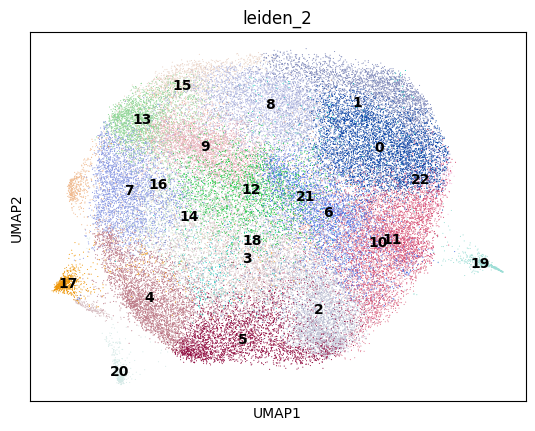

In [294]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

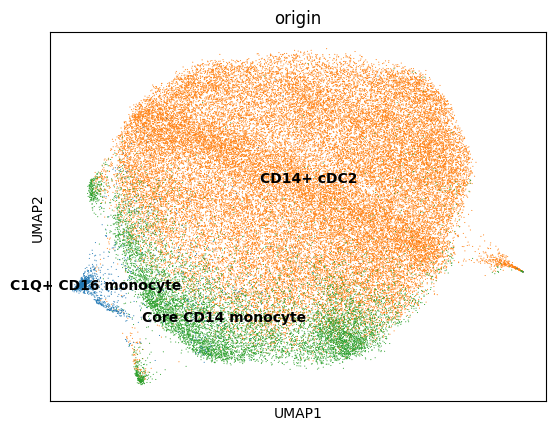

In [295]:
sc.pl.umap(adata, color = 'origin', legend_loc = 'on data')

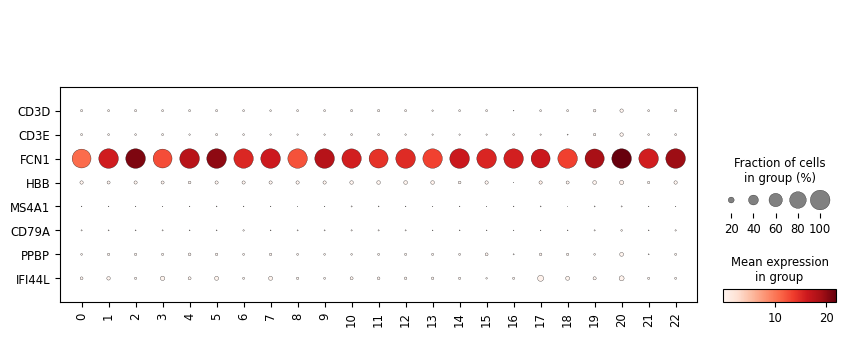

In [296]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

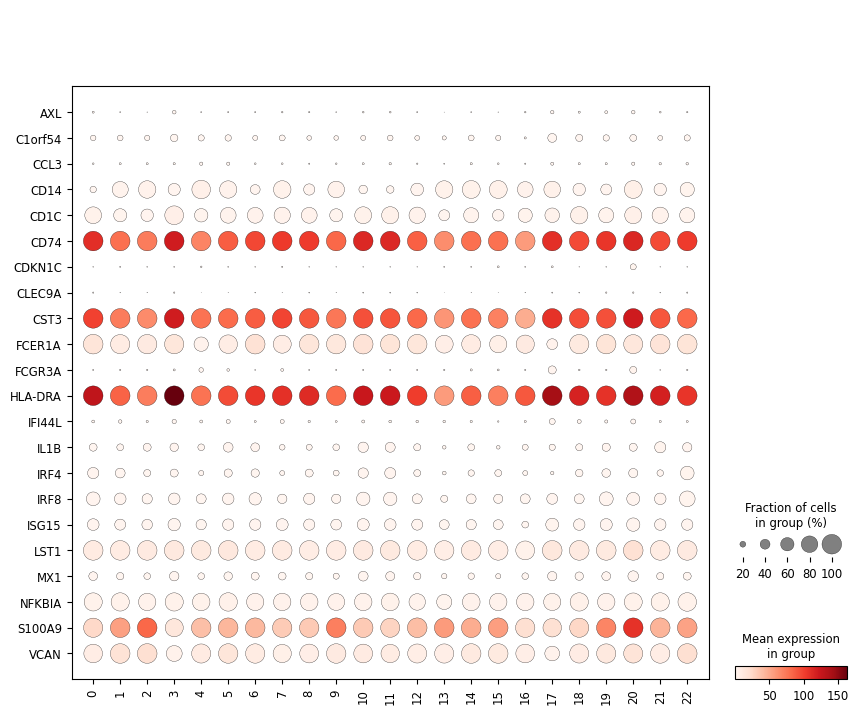

In [297]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

## Integrate Intermediate monocyte

### Proposed updates

- Integrate intermediate monocytes from other groups

In [147]:
cell_type = 'Intermediate monocyte'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [148]:
type_uuid

'93576d16-3c28-47e4-8e3e-0533232d01d8'

In [149]:
adata = read_adata_uuid(type_uuid)

# No Updates

## Pass-through HLA-DRhi cDC2

### Proposed updates

No proposed changes

In [65]:
cell_type = 'HLA-DRhi cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [66]:
type_uuid

'b98e59e7-73ea-4a81-a852-7b6d201c2b86'

In [67]:
adata = read_adata_uuid(type_uuid)

## Pass-through ISG+ cDC2

### Proposed updates

No proposed changes

In [80]:
cell_type = 'ISG+ cDC2'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [81]:
type_uuid

'57d60edc-e0a0-4d06-b7f6-931202a5d3c6'

In [82]:
adata = read_adata_uuid(type_uuid)

## Pass-through pDC

### Proposed updates

No proposed changes

In [93]:
cell_type = 'pDC'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [94]:
type_uuid

'e41f723e-e7ef-44c0-8f2d-150cca646c5a'

In [95]:
adata = read_adata_uuid(type_uuid)